# Miniproject: Landing on the Moon

## Introduction

### Description

Traditionally, reinforcement learning has operated on "tabular" state spaces, e.g. "State 1", "State 2", "State 3" etc. However, many important and interesting reinforcement learning problems (like moving robot arms or playing Atari games) are based on either continuous or very high-dimensional state spaces (like robot joint angles or pixels). Deep neural networks constitute one method for learning a value function or policy from continuous and high-dimensional observations. 

In this miniproject, you will teach an agent to play the Lunar Lander game from [OpenAI Gym](https://gym.openai.com/envs/LunarLander-v2/). The agent needs to learn how to land a lunar module safely on the surface of the moon. The state space is 8-dimensional and (mostly) continuous, consisting of the X and Y coordinates, the X and Y velocity, the angle, and the angular velocity of the lander, and two booleans indicating whether the left and right leg of the lander have landed on the moon.

The agent gets a reward of +100 for landing safely and -100 for crashing. In addition, it receives "shaping" rewards at every step. It receives positive rewards for moving closer to [0,0], decreasing in velocity, shifting to an upright angle and touching the lander legs on the moon. It receives negative rewards for moving away from the landing site, increasing in velocity, turning sideways, taking the lander legs off the moon and for using fuel (firing the thrusters). The best score an agent can achieve in an episode is about +250.

There are two versions of the task: one with discrete controls and one with continuous controls but we'll only work with the discrete version. In the discrete version, the agent can take one of four actions at each time step: [do nothing, fire engines left, fire engines right, fire engines down]. 

We will use Policy Gradient approaches (using the REINFORCE rule) to learn the task. As you remember, in standard supervised learning tasks (e.g. image classification), the network generates a probability distribution over the outputs, and is trained to maximize the probability of a specific target output given an observation (input). In Policy Gradient methods, the network generates a probability distribution over actions, and is trained to maximize expected future rewards given an observation.

### Questions
**Question 1**. Suppose that you are designing the environment rewards yourself. Why do you think it is a good idea to have rewards in addition to the +100 reward for safe landing (e.g. for moving closer / further from [0, 0], for touching the lander legs on the moon)? One might say that if we only have a final reward, the agent will still be able to learn how to reach it. What will be the problem here?

**Answer**: <font color='indianred'>Firstly, having additional rewards leads to a better control of the lunar aircraft landing. Indeed, all 8 observations variables that describe the module's state are tightly regulated by these additional rewards which fine-tune module's position, orientation and velocity. This way the RLAgent learns easier how to perform safer landing, the model considers many more factors which are important for achieving a safe landing. We additionally assume that this way the training will be less noisy which could be a deal-breaker when you train a RL model. Finally without additional rewards the agent would have no info about the designated landing spot at [0, 0] - it would target the surface randomly which would result in undesirable behaviour.</font>


**Question 2**. Now suppose you decide to give the agent a small reward if it moves closer to the landing point but you forget to penalize it when it moves away from it. What kinds of strange behaviour you may observe from the trained agent?

**Answer**: <font color='indianred'>In this case the trained agent would potentially learn to increase its velocity towards the landing point, but it would fail to learn how to break and stop on the surface. Thus it would accelerate during landing, increase its chance of crashing or landing in regions, distant from the landing point.</font>


### Prerequisites

- Since you are using Colab, everything is pre-installed, and you just need to run the cells. However, be careful with computational limits: any kernel in an *open* browser window is killed after 12 hours, and after 90 minutes if the window is **closed**.

- You can work in the same notebook within your team, but make sure to copy (this) notebook provided by TAs into your Google Drive and to use the proper sharing permissions.
  
- You should know the concepts of "policy", "policy gradient", "REINFORCE", "REINFORCE with baseline". If you want to start and haven't seen these yet in class, read Sutton & Barto (2018) Chapter 13 (13.1-13.4).

### What you will learn

- You will learn how to implement a policy gradient neural network using the REINFORCE algorithm.
- You will learn how to implement baselines, including a learned value network.
- You will learn how to analyze the performance of an RL algorithm.

### Notes 
- Reinforcement learning is noisy! Normally one should average over multiple random seeds with the same parameters to really see the impact of a change to the model, but we won't do this due to time constraints. However, you should be able to see learning over time with every approach. If you don't see any improvement, or very unstable learning, double-check your model and try adjusting the learning rate.

- You may sometimes see `AssertionError: IsLocked() = False` after restarting your code. To fix this, reinitialize the environments by running the Gym Setup code below.

- You will not be marked on the episode movies. Please delete these movies before uploading your code.

### Evaluation criteria

The miniproject is marked out of 18, with a further mark breakdown in each question:
- Exercise 1: 7 points
- Exercise 2: 3 points
- Exercise 3: 3 points
- Exercise 4: 5 points

We may perform random tests of your code but will not rerun the whole notebook.

## Dependencies Setup
Please run the following cell to install the required packages. Note that you may be asked to restart the notebook. After restarting and reruning the cells, everything should work.

In [ ]:
#remove " > /dev/null 2>&1" to see what is going on under the hood
!apt-get install -y xvfb python-opengl ffmpeg > /dev/null 2>&1
!pip3 install box2d-py > /dev/null 2>&1
!pip3 install gym[Box_2D] pyvirtualdisplay > /dev/null 2>&1

!apt-get update > /dev/null 2>&1
!apt-get install cmake > /dev/null 2>&1
!pip install --upgrade setuptools 2>&1
!pip install ez_setup > /dev/null 2>&1

Requirement already up-to-date: setuptools in /usr/local/lib/python3.7/dist-packages (57.0.0)


In [ ]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

### Your Names

Before you start, please enter your sciper number(s) in the field below; they are used to load the data.

In [ ]:
sciper = {'student_1': 313180, 
          'student_2': 274033}
seed = sciper['student_1']+sciper['student_2']

## Setup

### Dependencies and constants

In [ ]:
import gym
from gym import logger as gymlogger
from gym.wrappers import Monitor
gymlogger.set_level(40) #error only
import numpy as np
import random
import matplotlib.pyplot as plt
%matplotlib inline
import math
import glob
import logging
import io
import base64

import tensorflow_probability as tfp

import torch

from IPython import display as ipythondisplay
from IPython.display import HTML, clear_output

from matplotlib.animation import FuncAnimation
from pyvirtualdisplay import Display
from gym.envs.box2d.lunar_lander import heuristic
display = Display(visible=0, size=(1400, 900))
display.start()

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Lambda, InputLayer
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K
from tensorflow.keras.utils import to_categorical

np.random.seed(seed)
tf.random.set_seed(seed*2)

### Gym Setup

Here we load the Reinforcement Learning environments from Gym.

We limit each episode to 500 steps so that we can train faster. 

In [ ]:
gym.logger.setLevel(logging.ERROR)
discrete_env = gym.make('LunarLander-v2')
discrete_env._max_episode_steps = 500
discrete_env.seed(seed*3)
gym.logger.setLevel(logging.WARN)

%matplotlib inline
plt.rcParams['figure.figsize'] = 12, 8
plt.rcParams["animation.html"] = "jshtml"

### Utilities

We include a function that lets you visualize an "episode" (i.e. a series of observations resulting from the actions that the agent took in the environment).

As well, we will use the `Results` class (a wrapper around a python dictionary) to store, save, load and plot your results. You can save your results to disk with `results.save('filename')` and reload them with `Results(filename='filename')`. Use `results.pop(experiment_name)` to delete an old experiment.

In [ ]:
def AddValue(output_size, value):
    return Lambda(lambda x: x + value, output_shape=(output_size,))

def render(episode, env):
    
    fig = plt.figure()
    img = plt.imshow(env.render(mode='rgb_array'))
    plt.axis('off')

    def animate(i):
        img.set_data(episode[i])
        return img,

    anim = FuncAnimation(fig, animate, frames=len(episode), interval=24, blit=True)
    html = HTML(anim.to_jshtml())
    
    plt.close(fig)
    
    return html

class Results(dict):
    
    def __init__(self, *args, **kwargs):
        if 'filename' in kwargs:
            data = np.load(kwargs['filename'])
            super().__init__(data)
        else:
            super().__init__(*args, **kwargs)
        self.new_key = None
        self.plot_keys = None
        self.ylim = None
        
    def __setitem__(self, key, value):
        super().__setitem__(key, value)
        self.new_key = key

    def plot(self, window):
        clear_output(wait=True)
        for key in self:
            #Ensure latest results are plotted on top
            if self.plot_keys is not None and key not in self.plot_keys:
                continue
            elif key == self.new_key:
                continue
            self.plot_smooth(key, window)
        if self.new_key is not None:
            self.plot_smooth(self.new_key, window)
        plt.xlabel('Episode')
        plt.ylabel('Reward')
        plt.legend(loc='lower right')
        if self.ylim is not None:
            plt.ylim(self.ylim)
        plt.show()
        
    def plot_smooth(self, key, window):
        if len(self[key]) == 0:
            plt.plot([], [], label=key)
            return None
        y = np.convolve(self[key], np.ones((window,))/window, mode='valid')
        x = np.linspace(window/2, len(self[key]) - window/2, len(y))
        plt.plot(x, y, label=key)
        
    def save(self, filename='results'):
        np.savez(filename, **self)

### Test runs

To get an idea of how the environment works, we'll plot an episode resulting from random actions at each point in time, and a "perfect" episode using a specially-designed function to land safely within the yellow flags. 

Please remove these plots before submitting the miniproject to reduce the file size.

In [ ]:
def run_fixed_episode(env, policy):
    frames = []
    observation = env.reset()
    done = False
    while not done:
        frames.append(env.render(mode='rgb_array'))
        action = policy(env, observation)
        observation, reward, done, info = env.step(action)
    return frames
    
def random_policy(env, observation):
    return env.action_space.sample()

def heuristic_policy(env, observation):
    return heuristic(env.unwrapped, observation)

In [ ]:
episode = run_fixed_episode(discrete_env, random_policy)
render(episode, discrete_env)

In [ ]:
episode = run_fixed_episode(discrete_env, heuristic_policy)
render(episode, discrete_env)

## Experiment Loop

This is the method we will call to setup an experiment. Reinforcement learning usually operates on an Observe-Decide-Act cycle, as you can see below.

You don't need to add anything here; you will be working directly on the RL agent.

In [ ]:
num_episodes = 3000

def run_experiment(experiment_name, 
                   env, 
                   num_episodes, 
                   policy_learning_rate=0.001, 
                   value_learning_rate=0.001, 
                   baseline=None, 
                   entropy_cost=0, 
                   max_ent_cost=0, 
                   num_layers=3):
    if baseline is not None:
        print(baseline)
    #Initiate the learning agent
    agent = RLAgent(n_obs=env.observation_space.shape[0], 
                    action_space=env.action_space,
                    policy_learning_rate=policy_learning_rate, 
                    value_learning_rate=value_learning_rate, 
                    discount=0.99, 
                    baseline=baseline, 
                    num_layers=num_layers)

    rewards = []
    all_episode_frames = []
    step = 0
    for episode in range(1, num_episodes+1):
    
        #Update results plot and occasionally store an episode movie
        episode_frames = None
        if episode % 10 == 0:
            results[experiment_name] = np.array(rewards)
            results.plot(10)
        if episode % 500 == 0:
            episode_frames = []
            
        #Reset the environment to a new episode
        observation = env.reset()
        episode_reward = 0

        while True:
        
            if episode_frames is not None:
                episode_frames.append(env.render(mode='rgb_array'))

            # 1. Decide on an action based on the observations
            action = agent.decide(observation)

            # 2. Take action in the environment
            type(env.action_space)
            next_observation, reward, done, info = env.step(action)
            episode_reward += reward

            # 3. Store the information returned from the environment for training
            agent.observe(observation, action, reward)

            # 4. When we reach a terminal state ("done"), use the observed episode to train the network
            if done:
                rewards.append(episode_reward)
                
                if episode_frames is not None:
                    all_episode_frames.append(episode_frames)
                agent.train()
                
                break

            # Reset for next step
            observation = next_observation
            step += 1
            
    # Here we slightly changed the function so it outputs the final reward
    # in the last episode
    return all_episode_frames, episode_reward, agent

## The Agent

Here we give the outline of a python class that will represent the reinforcement learning agent (along with its decision-making network). We'll modify this class to add additional methods and functionality throughout the course of the miniproject.


In [ ]:
class RLAgent(object):
    """
    The Reinforcement Learning Agent that could learn how to play different
    games based on OpenAI Gym environments. Here we exploit the policy gradient 
    technique using Keras implementation of artificial neural networks.

    Parameters
    ----------
    n_obs
        The dimensionality of state space
    n_act
        The dimensionality of action space
    baseline
        The type of baseline used to optimize the policy network training. 
        If None then no baseline is used. If 'simple' then the baseline is a 
        moving of the mean returns. If 'adaptive' then the baseline is learned
        using the additional value network
    mean_over_episodes
        The list that stores the moving average that is used when we train the
        policy network using 'simple' baseline 
    plr
        The learning rate used for training the policy network
    vlr
        The learning rate used for training the value networks, in case the
        baseline is 'adaptive'
    gamma
        The discount value that is less than 1 that corrects the rewards at
        the later episode steps
    num_layers
        The number of hidden layers in the policy network
    episode_observations
        The list that stores the observations for the current episode
    episode_actions
        The list that stores the actions for the current episode
    episode_rewards
        The list that stores the rewards for the current episode
    """
    
    def __init__(self, n_obs: int, action_space: int, 
                 policy_learning_rate: float = 0.001, 
                 value_learning_rate: float = 0.001, 
                 discount: float = 0.99, 
                 baseline: str = None, 
                 num_layers: int = 3):

        # Setting up the dimensionality of state and action space 
        self.n_obs = n_obs
        self.n_act = action_space.n

        # Setting up the type of baseline used in training
        self.baseline = baseline

        # Storing the moving average in case when baseline = 'simple'
        self.mean_over_episodes = []
        
        # Setting up training hyperparameters
        self.plr = policy_learning_rate
        self.vlr = value_learning_rate
        self.gamma = discount
        self.num_layers = num_layers

        # Store various information about the episode
        self.episode_observations, self.episode_actions, self.episode_rewards = [], [], []

        # Build the policy network and value network
        self._build_network()

    def observe(self, state, action, reward):
        """ This function takes the observations the agent received from the environment and stores them
            in the lists above."""

        # Storing the observations with the corresponding actions and rewards
        self.episode_observations.append(state)
        self.episode_actions.append(action)
        self.episode_rewards.append(reward)
        
    def decide(self, state):
        """ This function feeds the observed state to the network, which returns a distribution
            over possible actions. Sample an action from the distribution and return it."""   
        
        # Retrieve the normalized Softmax probabilities from the model
        probs = self.policy_network(state.reshape(1, 8)).numpy().squeeze()

        # Sample the action from the probability distribution
        action = np.random.choice(self.n_act, p=probs)
        
        return action
        

    def train(self):
        """ When this function is called, the accumulated episode observations, actions and discounted rewards
            should be fed into the network and used for training. Use the _get_returns function to first turn 
            the episode rewards into discounted returns. 
    
            Apply simple or adaptive baselines if needed, depending on parameters."""
        
        # Training on batch the policy network with baseline-based returns
        self.policy_network.train_on_batch(
            tf.convert_to_tensor(self.episode_observations),
            tf.convert_to_tensor(to_categorical(self.episode_actions, num_classes=self.n_act)),
            tf.convert_to_tensor(self._get_returns())
        )

        # Training on batch the value network, if we have the 'adaptive' baseline
        if self.baseline=='adaptive':
            self.value_network.train_on_batch(
                tf.convert_to_tensor(self.episode_observations),
                tf.convert_to_tensor(self._get_returns())
            )
        
        # Resetting the information about the episode
        self.episode_observations, self.episode_actions, self.episode_rewards = [], [], []


    def _get_returns(self):
        """ This function should process self.episode_rewards and return the discounted episode returns
            at each step in the episode. Hint: work backwards."""
           
        # Storing the discounted accumulated rewards
        discounted_rewards = np.zeros(len(self.episode_rewards))
        cumulative_rewards = 0

        # Computing discounted rewards by going backwards
        for i in reversed(range(0, len(self.episode_rewards))):
            cumulative_rewards = cumulative_rewards * self.gamma + self.episode_rewards[i]
            discounted_rewards[i] = cumulative_rewards

        # Adjusting the discounted rewards using simple baseline
        if self.baseline=='simple':
            self.mean_over_episodes.append(np.mean(discounted_rewards))
            discounted_rewards -= np.mean(self.mean_over_episodes)
          
        # Adjusting the discounted rewards using adaptive baseline
        elif self.baseline=='adaptive':
            baseline = self.value_network.predict_on_batch(np.array(self.episode_observations))
            discounted_rewards -= np.squeeze(baseline)
    
        return discounted_rewards

    def _build_network(self):
        """ This function should build the network that can then be called by decide and train. 
            The network takes observations as inputs and has a policy distribution as output."""

        # Setting up the policy network architecture
        policy_network = Sequential(
            [InputLayer(8,)] + \
            [Dense(16, activation="relu", name=f'layer{i+1}') for i in range(self.num_layers)] + \
            [Dense(4, activation="softmax", name="softmax_layer")]
        )
        opt = Adam(learning_rate=self.plr)
        policy_network.compile(loss='categorical_crossentropy', optimizer=opt)
        self.policy_network = policy_network

        # Setting up additional value network if the baseline is adaptive
        if self.baseline=='adaptive':
            value_network = Sequential(
                [
                 InputLayer(8,),
                 Dense(16,activation="relu", name="layer1"),
                 Dense(16,activation="relu", name="layer2"),
                 Dense(16,activation="relu", name="layer3"),
                 Dense(1, activation="linear", name="output_layer")
                ]
            )
            value_opt = Adam(learning_rate=self.vlr)
            value_network.compile(loss='mean_squared_error', optimizer=value_opt)
            self.value_network = value_network

## Exercise 1: REINFORCE with simple baseline

### Description

Implement the REINFORCE Policy Gradient algorithm using a deep neural network as a function approximator.

1. Implement the `observe` method of the RLAgent above.
2. Implement the `_build_network` method. Your network should take the 8-dimensional state space as input and output a softmax distribution over the 4 discrete actions. It should have 3 hidden layers with 16 units each with ReLU activations. Use the REINFORCE loss function. HINT: Keras has a built-in "categorical cross-entropy" loss, and a `sample_weight` argument in fit/train_on_batch. Consider how these could be used together.
3. Implement the `decide`, `train` and `_get_returns` methods using the inputs and outputs of your network. In `train`, implement a baseline based on a moving average (over episodes) of the mean returns (over trials of one episode); it should only be in effect when the agent is constructed with the `use_simple_baseline` keyword. Also, use `train_on_batch` to form one minibatch from all the experiences in an episode. Hint: see Question 2) below.
4. Try a few learning rates and pick the best one (the default for Adam is a good place to start). Run the functions below and include the resulting plots, with and without the baseline, for your chosen learning rate. 
5. Answer the questions below in max. 1-2 sentence(s).

WARNING: Running any experiments with the same names (first argument in run_experiment) will cause your results to be overwritten. 

**Mark breakdown: 7 points total**
- 5 points for implementing and plotting basic REINFORCE with reasonable performance (i.e. a positive score) and answering the questions below.
- 2 points for implementing and plotting the simple baseline with reasonable performance.

### Solution

After finishing RLagent implementation, we are ready to train the model. We should note that when we create an RLagent object, we use `baseline` parameter to choose the type of baseline for the model. Up to this point, if `baseline=None` then the agent uses no baseline, if `baseline='simple'` then it uses a simple baseline based on a moving return average.


Let us first try different learning rates for the **model without baseline** - basic REINFORCE algorithm.

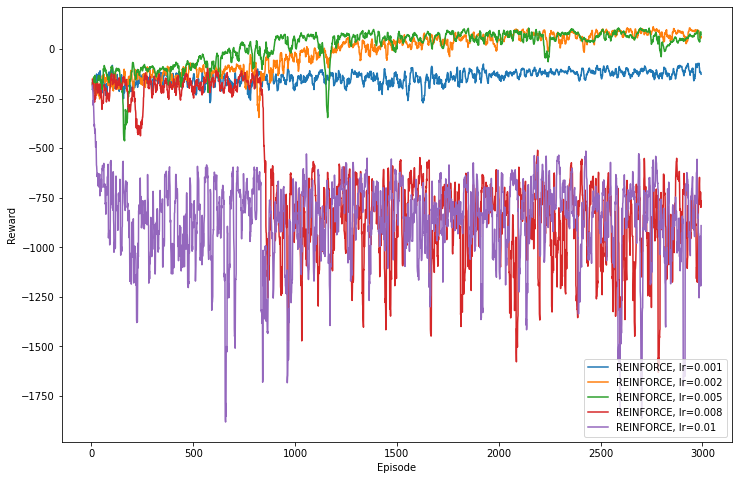

In [ ]:
# Running and saving learning rate optimization for model without baseline
results = Results()
lrs = [0.001, 0.002, 0.005, 0.008, 0.01]
final_rewards = []
for lr in lrs:
    _, final_reward, _ = run_experiment(f"REINFORCE, lr={lr}", discrete_env, num_episodes, lr)
    final_rewards.append(final_reward)

In [ ]:
# Printing rewards for each optimization step in the last episode
print('The rewards in the last episode for REINFORCE algorithm..')
for lr, reward in zip(lrs, final_rewards):
    print(f"REINFORCE, lr={lr}: {reward:.2f}")

The rewards in the last episode for REINFORCE algorithm..
REINFORCE, lr=0.001: -86.55
REINFORCE, lr=0.002: 151.81
REINFORCE, lr=0.005: 71.71
REINFORCE, lr=0.008: -419.14
REINFORCE, lr=0.01: -1138.15


We could observe that the model training significantly depends on the learning rate of the chosen optimizer (in this case it is Adam). Learning rate higher than 0.005 leads to considerable noise and training instability. If learning rate is lower than 0.005 we still observe a very noisy optimization. Nevertheless, the majority of training procedures with small learning rate resulted in models that achieved a positive reward in the last episode.

Let us produce the same plot, but for the **model with simple baseline**.

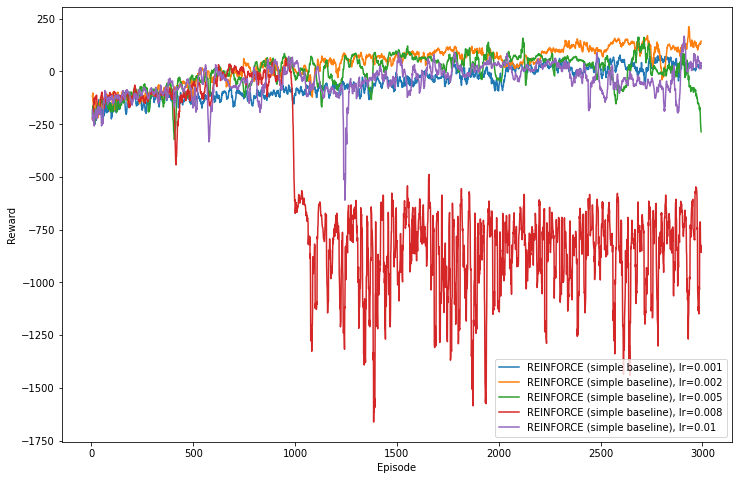

In [ ]:
# Running and saving learning rate optimization for model with baseline
results = Results()
lrs = [0.001, 0.002, 0.005, 0.008, 0.01]
final_rewards = []
for lr in lrs:
    _, final_reward, _ = run_experiment(f"REINFORCE (simple baseline), lr={lr}", discrete_env, num_episodes, lr, baseline='simple')
    final_rewards.append(final_reward)

In [ ]:
# Printing rewards for each optimization step in the last episode
print('The rewards in the last episode for REINFORCE with simple baseline algorithm..')
for lr, reward in zip(lrs, final_rewards):
    print(f"REINFORCE (simple baseline), lr={lr}: {reward:.2f}")

The rewards in the last episode for REINFORCE with simple baseline algorithm..
REINFORCE (simple baseline), lr=0.001: 121.85
REINFORCE (simple baseline), lr=0.002: 212.65
REINFORCE (simple baseline), lr=0.005: -395.27
REINFORCE (simple baseline), lr=0.008: -637.05
REINFORCE (simple baseline), lr=0.01: 17.51


Here we observe similar behaviour - the higher the learning rate, the more instable is the training. It is important to note, that here we achieved significantly higher rewards in the final episodes.

Let us again plot the performance of the best networks with or without simple baseline. We additionally render the last episode for each network.

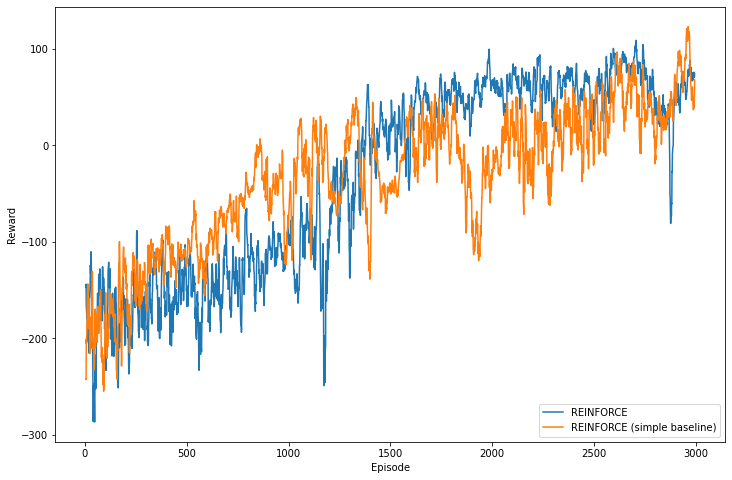

In [ ]:
# Visualizing the performance of optimized models with/without simple baseline
results = Results()
plr_no_baseline = 0.002
plr_simple = 0.002
episodes_no_baseline, final_reward_no_baseline, _ = run_experiment("REINFORCE", discrete_env, num_episodes, plr_no_baseline)
episodes_simple, final_reward_simple, _ = run_experiment("REINFORCE (simple baseline)", discrete_env, num_episodes, plr_simple, baseline='simple')

In [ ]:
# Rendering the last episode for the model without baseline
print(f'No baseline model performance during the last episode, reward is {final_reward_no_baseline}')
render(episodes_no_baseline[-1], discrete_env)

No baseline model performance during the last episode, reward is 87.08424911550763


In [ ]:
# Rendering the last episode with simple baseline
print(f'Simple baseline model performance during the last episode, reward is {final_reward_simple}')
render(episodes_simple[-1], discrete_env)

Simple baseline model performance during the last episode, reward is -2.7753883951874627


**Question 1**: We have at least three posibilities of picking the action: i) sample an action according to the softmax distribution, ii) select action with max action probability and iii) use an epsilon-greedy strategy. What is the difference between these strategies and which one(s) is(are) preferable during training and which one(s) is(are) preferable during testing?. 


**Answer**: <font color='indianred'>The questions above refer to ***Exploration vs Exploitation*** dilemma where one should choose between exploring all possible actions or preferring the optimal ones to maximize the reward. For example, selecting action with max probability of reward leads to greedy strategy and trap in a not necessarily optimal node - exploitation overcomes exploration in this case. There are different techniques that deal with this issue. The epsilon-greedy and softmax strategies produce suboptimal actions which balance between exploration and exploitation. Softmax strategy is preferable over epsilon-greedy strategy as each possible action is ranked and has different weight according to corresponding reward estimation, while epsilon-greedy strategy has no ranking. The choice of strategy also depends on whether you perform training or testing of the network. During training one should focus on exploration thus epsilon-greedy and softmax strategies are more preferable. During testing it is desirable to obtain maximal reward, thus one focuses on exploitation and the use of greedy policy.</font>

**Question 2**: In the train method above we throw away the data from an episode after we use it to train the network (make sure that you do that). Why is it not a good idea to keep the old episodes and train the policy network on both old and new data? (Note: Reusing data can still be possible but requires modifications to the REINFORCE algorithm that we are using).

**Answer**: <font color='indianred'>To our knowledge, the persistent training using old episodes could lead to ***model overfitting***. It means that the model is training to adapt its behaviour to specific episodes, rather than to learn the optimal strategy towards all possible episodes. This problem is very common and arises in all fields of machine learning. </font>

## Exercise 2: Adaptive baseline
### Description

Add a second neural network to your model that learns an observations-dependent adaptive baseline and subtracts it from your discounted returns.

1. Modify the `_build_network` function of RLAgent to create a second "value network" when `adaptive` is passed for the baseline argument. The value network should have the same or similar structure as the policy network, without the softmax at the output.
3. In addition to training your policy network, train the value network on the Mean-Squared Error compared to the discounted returns.
4. Train your policy network on $R - b(s)$, i.e. the returns minus the adaptive baseline (the output of the value network). Your implementation should allow for a different learning rate for the value and policy network.
5. Try a few learning rates and plot all your best results together (without baseline, with simple baseline, with adaptive baseline). You may or may not be able to improve on the simple baseline! Return the trained model to use it in the next exercise.

TECHNICAL NOTE: Some textbooks may refer to this approach as "Actor-Critic", where the policy network is the "Actor" and the value network is the "Critic". Sutton and Barto (2018) suggest that Actor-Critic only applies when the discounted returns are bootstrapped from the value network output, as you saw in class. This can introduce instability in learning that needs to be addressed with more advanced techniques, so we won't use it for this miniproject. You can read more about state-of-the-art Actor-Critic approaches here: https://arxiv.org/pdf/1602.01783.pdf

**Mark breakdown: 3 points total**
- 3 points for implementing and plotting the adaptive baseline with the other two conditions, with reasonable performance (i.e. at least similar to the performance in Exercise 1).

### Solution

Again, we will perform a small optimization of learning rates to obtain the best network.

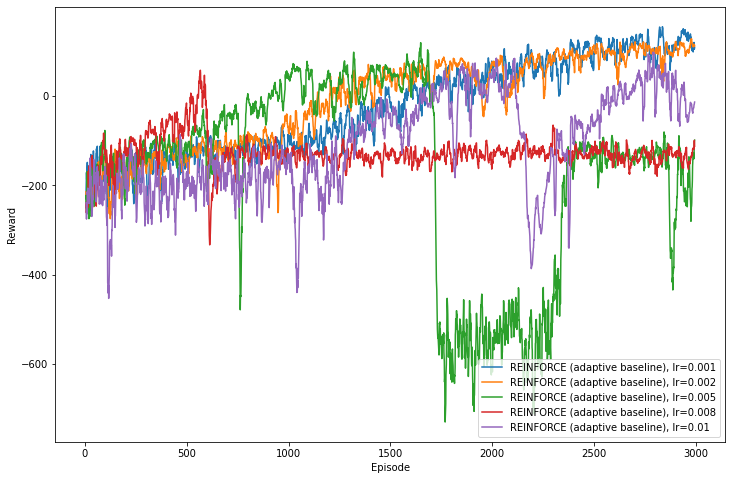

In [ ]:
# Running and saving learning rate optimization for model with adaptive baseline
results = Results()
lrs = [0.001, 0.002, 0.005, 0.008, 0.01]
final_rewards = []
for lr in lrs:
    _, final_reward, _ = run_experiment(f"REINFORCE (adaptive baseline), lr={lr}", 
                                        discrete_env, num_episodes, lr, baseline='adaptive')
    final_rewards.append(final_reward)

In [ ]:
# Printing rewards for each optimization step in the last episode
print('The rewards in the last episode for REINFORCE with adaptive baseline algorithm:')
for lr, reward in zip(lrs, final_rewards):
    print(f"REINFORCE (adaptive baseline), lr={lr}: {reward:.2f}")

The rewards in the last episode for REINFORCE with adaptive baseline algorithm:
REINFORCE (adaptive baseline), lr=0.001: 121.34
REINFORCE (adaptive baseline), lr=0.002: 96.74
REINFORCE (adaptive baseline), lr=0.005: -293.41
REINFORCE (adaptive baseline), lr=0.008: -18.20
REINFORCE (adaptive baseline), lr=0.01: -7.89


Now we can compare best networks from all three approaches.

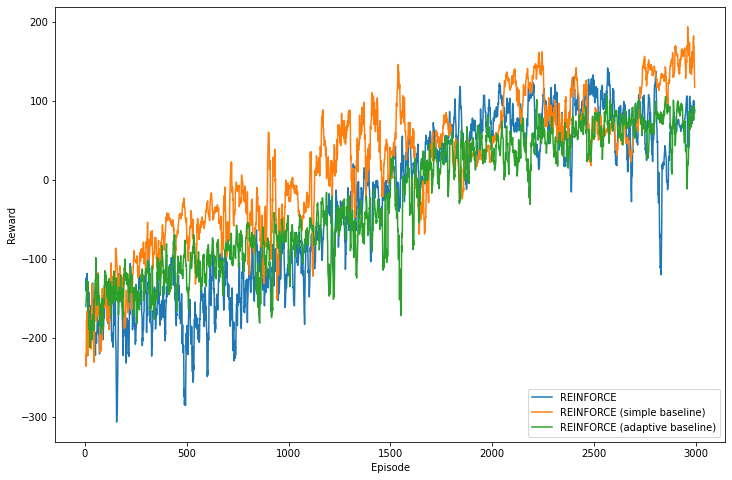

In [ ]:
# Visualizing the performance of optimized models with/without simple baseline
results = Results()
plr_no_baseline = 0.002
plr_simple = 0.002
plr_adaptive = 0.001
episodes_no_baseline, final_reward_no_baseline, _ = \
    run_experiment("REINFORCE", discrete_env, num_episodes, plr_no_baseline)
episodes_simple, final_reward_simple, _ = \
    run_experiment("REINFORCE (simple baseline)", discrete_env, num_episodes, 
                   plr_simple, baseline='simple')
episodes_adaptive, final_reward_adaptive, adaptive_model = \
    run_experiment("REINFORCE (adaptive baseline)", discrete_env, num_episodes, 
                   plr_adaptive, baseline='adaptive')

In [ ]:
# Printing rewards for each optimized network gained in the last episode
print('The rewards in the last episode of optimized networks..')
print(f'The no baseline network: {final_reward_no_baseline}')
print(f'The simple baseline network: {final_reward_simple}')
print(f'The adaptive baseline network: {final_reward_adaptive}')

The rewards in the last episode of optimized networks..
The no baseline network: 85.65957920558152
The simple baseline network: -23.347142184170906
The adaptive baseline network: 27.152141034028155


In [ ]:
# Rendering the last episode where adaptive baseline was used
print(f'Adaptive baseline model performance during the last episode')
render(episodes_adaptive[-1], discrete_env)

Adaptive baseline model performance during the last episode


We can conclude that adaptive baseline shows similar performance in comparison with simple baseline. We observe that it requires longer training (as simple baseline curve is slightly higher) which is probably due to the parameter optimization happening both in policy and value networks. We may suggest that if we increase the number of episodes used during training, the adaptive baseline would outcompete the simple one.

To conclude, we observed the significant instability during training the policy gradient network which frequently leads to incosistent results. As noted above, to obtain a model that shows robust performance we should perform a more versatile optimization with better hyperparameter search. 

## Exercise 3: Visualizing the Value Function

### Description

Ideally, our value network should have learned to predict the relative values across the input space. We can test this by plotting the value prediction for different observations.

1. Write a function to plot the value network prediction across [x,y] space for given (constant) values of the other state variables. X is always in [-1,1], and Y generally lies in [-0.2,1], where the landing pad is at [0,0]. (`plt.imshow`, `plt.title`, and `plt.colorbar` can be useful)
2. Plot (with titles specifying the state variable combinations) the values for 5-6 combinations of the other 6 state variables, including [0,0,0,0,0,0]. The X and Y velocity are generally within [-1,1], the angle is in [-pi,pi] and the angular velocity lies roughly within [-3,3]. The last two inputs indicating whether the legs have touched the ground are 0 (False) or 1 (True). Include two combinations with (one of the) state variables out of these ranges. Use the same color bar limits across the graphs so that they can be compared easily. 
3. Answer the question below in max. 2-3 sentence(s).

**Mark breakdown: 3 points total**
- 3 points for the plots of the value function and answering the question below.

### Solution

We will implement 2 helper functions that allow us to plot the desired value distribution across input space easily. 

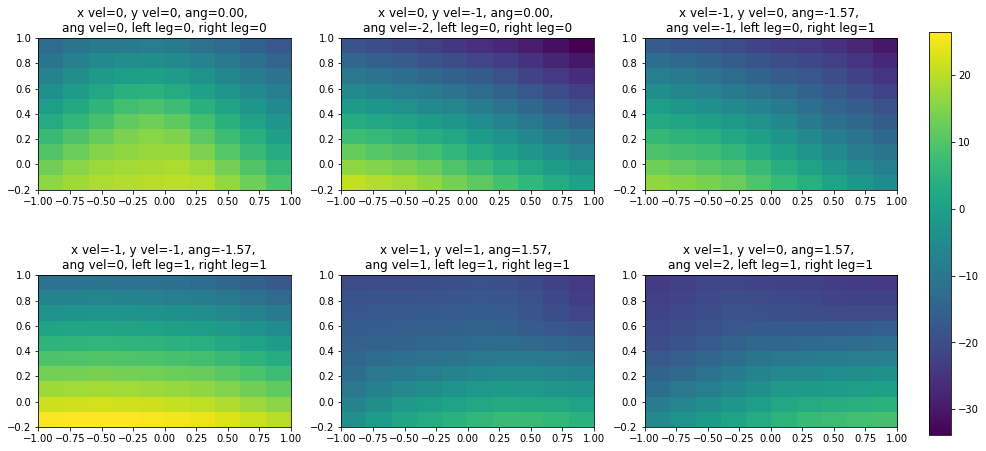

In [ ]:
def obtain_value_grid(val_model, x_v=0, y_v=0, a=0, a_v=0, is_l=0, is_r=0,
                      n_vals=10):
    """
    A helper function that obtains value grid corresponding to value 
    predictions across the input state
    
    Parameters
    ----------
    val_model
        The keras value network trained before using adaptive baseline
    x_v
        The fixed X velocity value (between [-1, 1])
    y_v
        The fixed Y velocity value (between [-1, 1])
    a
        The fixed angle value (between [-pi, pi])
    a_v
        The fixed angular velocity (between [-3, 3])
    is_l
        The fixed boolean value indicating lander's left leg touching the 
        surface
    is_l
        The fixed boolean value indicating lander's left leg touching the 
        surface
    n_vals
        The number of points within the x and y range

    Returns:
        The numpy ndarray of shape n_vals, n_vals - predicted values across 
        input space
    """
    
    # Creating an axis range used in heatmap
    x_range = np.linspace(-1, 1, num=n_vals)
    y_range = np.linspace(-0.2, 1, num=n_vals)

    # Creating grids for X and Y values
    x_grid, y_grid = np.meshgrid(x_range, y_range)

    # Flattening the grids to prepare for network input
    x_flattened, y_flattened = x_grid.flatten(), y_grid.flatten()

    # Creating the observations input to the neural network
    obs = np.concatenate(
        [
            np.expand_dims(x_flattened, axis=0).T, 
            np.expand_dims(y_flattened, axis=0).T,
            np.expand_dims([x_v for _ in range(n_vals**2)], axis=0).T,
            np.expand_dims([y_v for _ in range(n_vals**2)], axis=0).T,
            np.expand_dims([a for _ in range(n_vals**2)], axis=0).T,
            np.expand_dims([a_v for _ in range(n_vals**2)], axis=0).T,
            np.expand_dims([is_l for _ in range(n_vals**2)], axis=0).T,
            np.expand_dims([is_r for _ in range(n_vals**2)], axis=0).T,

        ], axis=1
    )

    # Obtaining the values predicted by network
    vs = val_model.predict(obs)

    # Preparing the value grid
    v_grid = vs.reshape(n_vals, n_vals)

    return v_grid


def compare_val_dists(val_model, fixed_vars):
    """
    A helper plotting function that visualizes the value network distribution 
    across the state space (x, y) while other state variables are fixed. 

    Parameters
    ----------
    val_model 
        The keras value network trained before using adaptive baseline
    fixed_vars
        A list of lists containing the fixed state-defining variables - x 
        velocity, y velocity, angle, angular velocity, touching the surface by 
        left and right leg. The number of lists defines corresponds to the 
        number of subplots. Example:
                                 x_v,   y_v,    a,    a_v,   is_l,  is_r
                        plot_1  [ 0,     0,     0,     0,     0,     0  ]
                        plot_2  [ 0,    -1,     0,    -2,     0,     0  ]
        fixed_vars =    plot_3  [-1,     0,   -pi/2,  -1,     0,     1  ]
                        plot_4  [-1,    -1,   -pi/2,   0,     1,     1  ]
                        plot_5  [ 1,     1,    pi/2,   1,     1,     1  ]
                        plot_6  [ 1,     0,    pi/2,   2,     1,     1  ]

    """

    # Extracting the value grids for all sets of fixed state variables
    v_grids = [
        obtain_value_grid(
            val_model, **dict(zip(['x_v', 'y_v', 'a', 'a_v', 'is_l', 'is_r'], vars))
        ) for vars in fixed_vars
    ]

    # Saving global minimum and maximum for all obtained values
    vmin, vmax = np.min(v_grids), np.max(v_grids)

    # Plotting..
    f, ax = plt.subplots(2, 3, figsize=(18, 10))

    ax_flattened = ax.flatten()

    for a, vars, v_grid in zip(ax_flattened, fixed_vars, v_grids):
        var_dict = dict(zip(['x_v', 'y_v', 'a', 'a_v', 'is_l', 'is_r'], vars))
        im = a.imshow(v_grid, cmap='viridis', vmin=vmin, vmax=vmax, 
                 extent=[-1, 1, -0.2, 1])
        a.set_title(
            'x vel={x_v}, y vel={y_v}, ang={a:.2f}, \nang vel={a_v}, left leg={is_l}, right leg={is_r}'.format(**var_dict)
            )
        
    f.subplots_adjust(right=0.92)
    cbar_ax = f.add_axes([0.95, 0.15, 0.02, 0.7])
    f.colorbar(im, cax=cbar_ax, shrink=0.5)

# Manually setting the 6 state variables for 6 plots
x_v_s = [0, 0, -1, -1, 1, 1]
y_v_s = [0, -1, 0, -1, 1, 0]
a_s = [0, 0, -np.pi/2, -np.pi/2, np.pi/2, np.pi/2]
a_v_s = [0, -2, -1, 0, 1, 2]
is_l_s = [0, 0, 0, 1, 1, 1]
is_r_s = [0, 0, 1, 1, 1, 1]

# Reshaping and preparing for compare_val_dists function
fixed_vars = [list(x) for x in zip(*[x_v_s, y_v_s, a_s, a_v_s, is_l_s, is_r_s])]

# Comparing value state distributions
compare_val_dists(adaptive_model.value_network, fixed_vars)

**Question**: Does your value map for the state variables combination [0,0,0,0,0,0] make sense? What about the value maps for the combinations with state variables out of the ranges above?

**Answer**: <font color='indianred'>Indeed, as expected we observe the maximal values close to landing pod at [0, 0] for subplots when we have zero angular velocity - it means that the lunar lander does not need to rotate and adjust its position towards the center. When the angular velocity is non-negative, we could see that the regions with higher value predictions are on the left and right sides of the heatmap (depending on angular velocity sign). We could additionally notice that heatmaps with positive x or y velocity are darker, thus they have lower value estimates. This fact also makes sense as RLAgent receives negative rewards when the velocity increases. Apparently, value function depends moderately on the last two variables (i.e. whether left or right leg touches the moon surface). </font>


## Exercise 4: Comparing Architectures
### Descrition

Choosing a good neural network architecture is always a tricky question - on one hand, you want a complex architecture that is flexible enough to be able to solve the task, and on the other hand, you want to train your network as fast as possible and to not overuse your computational power. In the previous sections, we asked you to create a network with 3 hidden layers which you saw that is able to successfully solve the task and play the game. What happens if we do the same with 1 or 2 hidden layers? In this exercise, we ask you to look into the effect of the architecture and to compare different models with each other.

1. Include an extra parameter `num_layers` in the RLAgent class (by default it is equal to 3).
2. Change the `_build_network` function so that it creates a policy and value networks with the required number of layers.
3. Compare (on the same axes) the resulting plots for num_layers = 1, 2, 3.

Let us perform some optimization by modulating the number of hidden layers with a fixed learning rate obtained in the previous sections. Here we will only focus on neural networks with adaptive baseline.

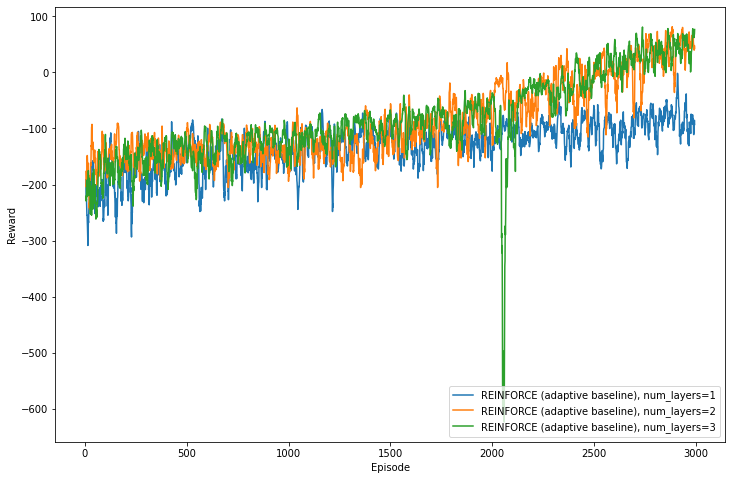

In [ ]:
# Running network optimization by changing the model complexity (num_layers)
results = Results()
layers = [1, 2, 3]
final_rewards = []
for num in layers:
    _, final_reward, _ = \
        run_experiment(f"REINFORCE (adaptive baseline), num_layers={num}", discrete_env, 
                       num_episodes, policy_learning_rate=0.001, 
                       baseline='adaptive', num_layers=num)
    final_rewards.append(final_reward)

In [ ]:
# Printing the results of optimization
print('The rewards in the last episode for REINFORCE with adaptive baseline algorithm:')
for num, reward in zip(layers, final_rewards):
    print(f"REINFORCE (adaptive baseline), num_layers={num}: {reward:.2f}")

The rewards in the last episode for REINFORCE with adaptive baseline algorithm:
REINFORCE (adaptive baseline), num_layers=1: -46.96
REINFORCE (adaptive baseline), num_layers=2: 41.98
REINFORCE (adaptive baseline), num_layers=3: 59.20


We can conclude that the complexity of the network directly influences its ability to model the action policy. When the network only consists of 1 hidden layer it is too simple to model the lander behaviour, thus the agent does not achieve the positive reward. There is a slight difference between networks with 2 and 3 hidden layers, we assume that it is negligible.

## For your Interest..

The code you've written above can be easily adapted for other environments in Gym. If you like, try playing around with different environments and network structures!